A continuación se tienen las indicaciones para ejecutar el programa en google collab, si se ejecuta en local solo hay que utilizar el kernel de Julia y ejecutar las celdas del script.  

# Configurando Julia como entorno de ejecución en collab

Ejecutar la siguiente celda y una vez termine la instalación reiniciar la pagina (ctrl + R, ⌘+R, or the F5) y si hace falta, cambiar el entonrno de ejcución de collab a Julia, dando clic en Entorno de ejecución -> Cambiar tipo de entorno de ejecución -> Julia.

In [ ]:
%%shell
set -e

#---------------------------------------------------#
JULIA_VERSION="1.9.3" # any version ≥ 0.7.0
JULIA_PACKAGES="IJulia BenchmarkTools Plots Statistics"
JULIA_PACKAGES_IF_GPU="CUDA" # or CuArrays for older Julia versions
JULIA_NUM_THREADS=2
#---------------------------------------------------#

if [ -z `which julia` ]; then
  # Install Julia
  JULIA_VER=`cut -d '.' -f -2 <<< "$JULIA_VERSION"`
  echo "Installing Julia $JULIA_VERSION on the current Colab Runtime..."
  BASE_URL="https://julialang-s3.julialang.org/bin/linux/x64"
  URL="$BASE_URL/$JULIA_VER/julia-$JULIA_VERSION-linux-x86_64.tar.gz"
  wget -nv $URL -O /tmp/julia.tar.gz # -nv means "not verbose"
  tar -x -f /tmp/julia.tar.gz -C /usr/local --strip-components 1
  rm /tmp/julia.tar.gz

  # Install Packages
  nvidia-smi -L &> /dev/null && export GPU=1 || export GPU=0
  if [ $GPU -eq 1 ]; then
    JULIA_PACKAGES="$JULIA_PACKAGES $JULIA_PACKAGES_IF_GPU"
  fi
  for PKG in `echo $JULIA_PACKAGES`; do
    echo "Installing Julia package $PKG..."
    julia -e 'using Pkg; pkg"add '$PKG'; precompile;"' &> /dev/null
  done

  # Install kernel and rename it to "julia"
  echo "Installing IJulia kernel..."
  julia -e 'using IJulia; IJulia.installkernel("julia", env=Dict(
      "JULIA_NUM_THREADS"=>"'"$JULIA_NUM_THREADS"'"))'
  KERNEL_DIR=`julia -e "using IJulia; print(IJulia.kerneldir())"`
  KERNEL_NAME=`ls -d "$KERNEL_DIR"/julia*`
  mv -f $KERNEL_NAME "$KERNEL_DIR"/julia

  echo ''
  echo "Successfully installed `julia -v`!"
  echo "Please reload this page (press Ctrl+R, ⌘+R, or the F5 key) then"
  echo "jump to the 'Checking the Installation' section."
fi

Installing Julia 1.9.3 on the current Colab Runtime...
2023-10-16 15:40:29 URL:https://storage.googleapis.com/julialang2/bin/linux/x64/1.9/julia-1.9.3-linux-x86_64.tar.gz [146268149/146268149] -> "/tmp/julia.tar.gz" [1]
Installing Julia package IJulia...
Installing Julia package BenchmarkTools...
Installing Julia package Plots...
Installing Julia package Statistics...
Installing IJulia kernel...
[ Info: Installing julia kernelspec in /root/.local/share/jupyter/kernels/julia-1.9

Please reload this page (press Ctrl+R, ⌘+R, or the F5 key) then
jump to the 'Checking the Installation' section.


In [ ]:
versioninfo()

Julia Version 1.9.3
Commit bed2cd540a1 (2023-08-24 14:43 UTC)
Build Info:
  Official https://julialang.org/ release
Platform Info:
  OS: Linux (x86_64-linux-gnu)
  CPU: 2 × Intel(R) Xeon(R) CPU @ 2.20GHz
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-14.0.6 (ORCJIT, broadwell)
  Threads: 3 on 2 virtual cores
Environment:
  LD_LIBRARY_PATH = /usr/local/nvidia/lib:/usr/local/nvidia/lib64
  JULIA_NUM_THREADS = 2


# Script en Julia

In [ ]:
using Plots #Libreria para graficar
using Statistics #Libreria para calcular estadisticas basicas

In [ ]:
# Autor: Angel Martínez
# Fecha: 30 de septiembre de 2023
# Descripción: Simulación de la paradoja de parrondo para el lanzamiento de una moneda, con M = 3 y epsilon = 0.005.


"""
    juegoA(capital::Int)
Simula el juego donde se lanza una moneda ligeramente cargada en contra.

Parámetros:
- `capital::Int`: Capital inicial, (antes de lanzar la moneda).

Returns:
- `capital`: Capital despues de haber lanzado la moneda.
"""
function juegoA(capital::Int)
    epsilon = 0.005
    numero_aleatorio = rand() #Genera un número aleatorio entre 0 y 1
    if numero_aleatorio < 1/2 - epsilon #Si el número es menor que 1/2 - e, se suma 1 al capital
        capital += 1
    else #De lo contrario se resta 1 al capital
        capital -= 1
    end
    return capital
end

"""
    juegoB(capital::Int)
Simula el juego donde se lanza una moneda cargada en contra o a favor, dependiendo de si el capital es o no divisible por 3, respectivamente.

Parámetros:
- `capital::Int`: Capital inicial, (antes de lanzar la moneda).

Returns:
- `capital`: Capital despues de haber lanzado la moneda.
"""
function juegoB(capital::Int)
    epsilon = 0.005
    numero_aleatorio = rand() #Genera un número aleatorio entre 0 y 1
    if capital % 3 == 0 #Si el capital es divisible entre 3, se juega con la moneda cargada en contra
        if numero_aleatorio < 1/10 - epsilon  #Si el número es menor que 1/10 - e, se suma 1 al capital
            capital += 1
        else #De lo contrario se resta 1 al capital
            capital -= 1
        end
    else #Si el capital no es divisible entre 3, se juega con la moneda cargada a favor
        if numero_aleatorio < 0.75 - epsilon #Si el número es menor que 3/4 - e, se suma 1 al capital
            capital += 1
        else #De lo contrario se resta 1 al capital
            capital -= 1
        end
    end
end

juegoB

In [ ]:
"""
    ejecucion(capital::Int,estrategia::String,lanzamientos::Int)
Ejecuta el juego un número determinado de veces siguiendo la estrategia indicada.

Parámetros:
- `capital::Int`: Capital inicial.
- `estrategia::String`: Orden en que se vana jugar los juegos A y B.
- `lanzamientos::Int`: Número de veces que se va a repetir la estrategia.

Returns:
- `capital`: Capital despues de haber terminado la partida.
- `historia`: Vector que contiene el capital despues de cada juego.
"""
function ejecucion(; capital::Int,estrategia::String,lanzamientos::Int)
    i = 0
    historia = Vector{Float64}()
    while i < lanzamientos
        for letra in 1:length(estrategia)
            if estrategia[letra] == 'A'
                capital = juegoA(capital) #Juega al juego A.
                push!(historia, capital) #Agrega el capital a la historia despues de jugar.
            elseif estrategia[letra] == 'B'
                capital = juegoB(capital) #Juega al juego B.
                push!(historia, capital) #Agrega el capital a la historia despues de jugar.
            else
                println("Error: Solo existen los juegos A y B.")
            end
        end
        i += 1
    end
    return capital, historia
end

"""
    probar_estrategia(capital::Int, estrategia::String, lanzamientos::Int, partidas::Int)
Prueba la estrategia en un número determinado de partidas distintas.

Parámetros:
- `capital::Int`: Capital inicial.
- `estrategia::String`: Orden en que se vana jugar los juegos A y B.
- `lanzamientos::Int`: Número de veces que se va a repetir la estrategia.
- `partidas::Int`: Número de veces que se va a repetir la partida.

Returns:
- `historias`: Vector que contiene la historia (capital luego de cada juego) de cada partida.
- `capitales_finales`: Vector que contiene el valor del capital al final de cada partida.
"""
function probar_estrategia(; capital::Int, estrategia::String, lanzamientos::Int, partidas::Int)
    historias = Vector{Vector{Float64}}()
    capitales_finales = Vector{Float64}()

    for _ in 1:partidas
        capital_final, historia = ejecucion(capital=capital, estrategia=estrategia, lanzamientos=lanzamientos)
        push!(historias, historia)
        push!(capitales_finales, capital_final)
    end
    return capitales_finales, historias
end

"""
    graficar_estrategia(historias::Vector{Vector{Float64}}(), capitales_finales::Vector{Float64}())
Grafica las historias contra el número de lanzamientos, así como el capital final de cada partida en un histograma.

Parámetros:
- `historias::Vector{Vector{Float64}}()`: Vector que contiene la historia (capital luego de cada juego) de cada partida.
- `capitales_finales::Vector{Float64}()`: Vector que contiene el valor del capital al final de cada partida.
"""
function graficar_estrategia(capitales_finales::Vector{Float64}, historias::Vector{Vector{Float64}})

    grafica_historias = plot(legend=false, xlabel="Lanzamientos", ylabel="Ganancia", title="Evolución de la ganancia obtenida.")
    for historia in historias
        plot!(0:length(historia) - 1, historia)
    end
    display(grafica_historias) #Mostrar el gráfico en pantalla
    savefig("grafica_historias.png") #Guardar el gráfico como un archivo .png

    capitales_finales = histogram(capitales_finales, bins=20, xlabel="Capital Final", ylabel="Frecuencia", title="Distribución de los capitales finales", legend=false)
    plot(capitales_finales) #Mostrar el gráfico en pantalla
    display(capitales_finales) #Guardar el gráfico como un archivo .png
    savefig("capitales_finales.png")
end

"""
    graficar_promedios(historias::Vector{Vector{Float64}}...)
Grafica el promedio de las historias contra el número de lanzamientos, para cada estrategia probada.

Parámetros:
- `etiquetas::Vector{String}`: Lista con las etiquetas para cada estrategia.
- `historias::Vector{Vector{Float64}}()`: Vector que contiene la historia (capital luego de cada juego) de cada partida.
"""
function graficar_promedios(etiquetas::Vector{String} = [], historias::Vector{Vector{Float64}}...)
    promedio = zeros(Float64, length(historias[1][1]))
    grafica_promedios = plot(xlabel="Lanzamientos", ylabel="Ganancia", title="Evolución del promedio de ganancia")
    i = 1
    for historia in historias
        for vector in historia
            promedio .+= vector  # Sumatoria de las historias
        end
        promedio ./= (length(historias) * length(historias[1])) #Dividir entre el número de historias para obtener el promedio.
        plot!(grafica_promedios, 0:length(promedio) - 1, promedio,label=etiquetas[i]) #Graficar el promedio
    i += 1
    end
    display(grafica_promedios) #Mostrar el gráfico en pantalla
    savefig("grafica_promedios.png") #Guardar el gráfico como un archivo .png
end

graficar_promedios

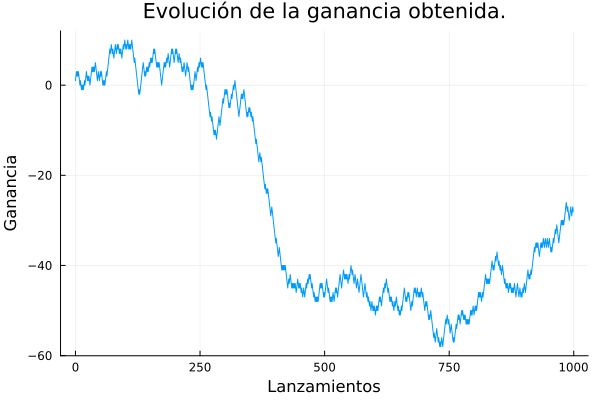

"/content/PartidaA.png"

In [ ]:
capital_final, historia = ejecucion(capital=0,estrategia="A",lanzamientos=1000)
display(plot(0:length(historia)-1, historia, xlabel="Lanzamientos", ylabel="Ganancia", title="Evolución de la ganancia obtenida.",label=false))
savefig("PartidaA.png")

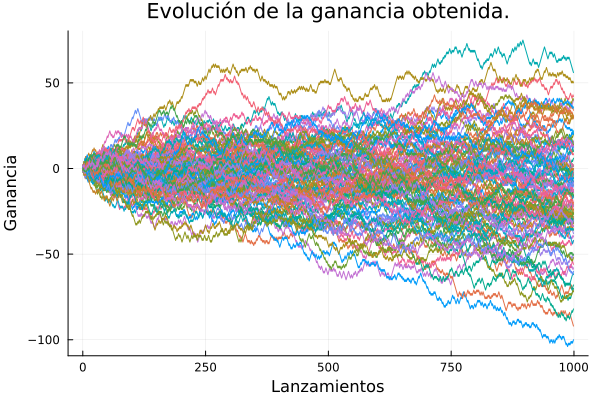

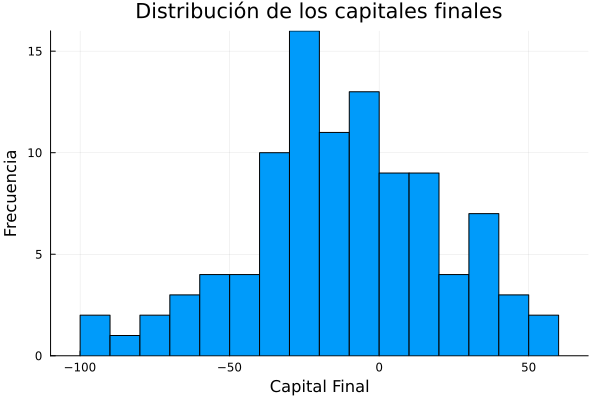

"/content/capitales_finales.png"

In [ ]:
(capitales_A, historias_A) = probar_estrategia(capital=0, estrategia="A", lanzamientos=1000, partidas=100)
graficar_estrategia(capitales_A, historias_A)

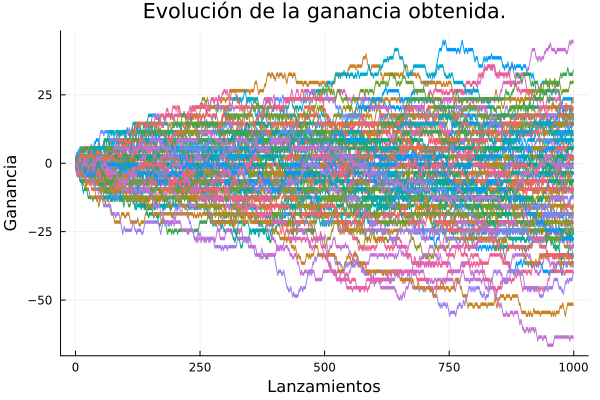

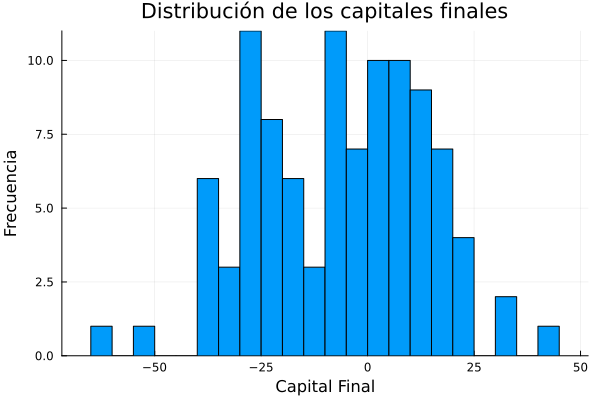

"/content/capitales_finales.png"

In [ ]:
(capitales_B, historias_B) = probar_estrategia(capital=0, estrategia="B", lanzamientos=1000, partidas=100)
graficar_estrategia(capitales_B, historias_B)

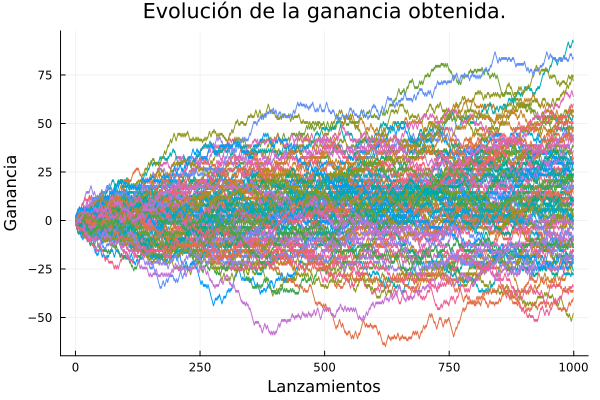

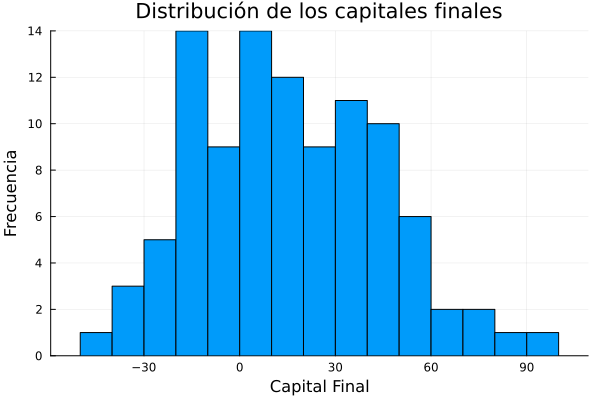

"/content/capitales_finales.png"

In [ ]:
(capitales_AB, historias_AB) = probar_estrategia(capital=0, estrategia="AABB", lanzamientos=250, partidas=100)
graficar_estrategia(capitales_AB, historias_AB)

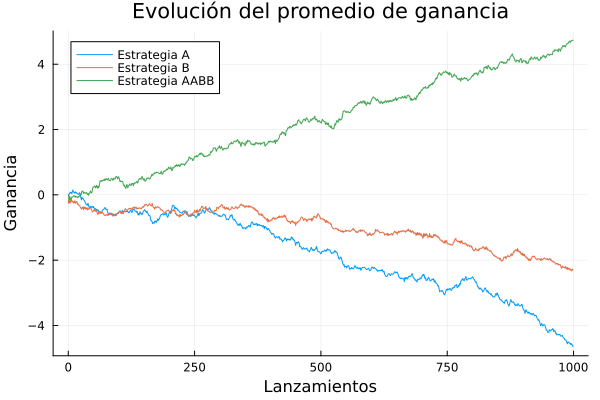

"/content/grafica_promedios.png"

In [ ]:
graficar_promedios(["Estrategia A","Estrategia B","Estrategia AABB"],historias_A,historias_B,historias_AB)